# Семинар: Компьютерное зрение. 
## GAN & VAE. Часть 1.
## Обучение VQ-VAE/GAN на Покемонах

In [22]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import os
from tqdm import tqdm
from typing import Tuple, List, Dict, Optional
import glob

# Установка устройства
device: torch.device = torch.device('cuda:2' if torch.cuda.is_available() else 'cpu')
print(f"Используется устройство: {device}")
if torch.cuda.is_available():
    print(f"Название GPU: {torch.cuda.get_device_name(0)}")

Используется устройство: cuda:2
Название GPU: NVIDIA A100-SXM4-80GB


### 1. Подготовка данных

In [23]:
class PokemonDataset(Dataset):
    """
    Датасет покемонов для PyTorch
    Структура: root_dir/{i}.png 
    """
    def __init__(self, root_dir: str, transform: Optional[transforms.Compose] = None):
        self.root_dir: str = root_dir
        self.transform: Optional[transforms.Compose] = transform
        self.images: List[str] = []
        
        self._load_images()
    
    def _load_images(self) -> None:
        """Загрузка путей к изображениям"""
        
        # Ищем все PNG файлы
        self.images = sorted(glob.glob(os.path.join(self.root_dir, '*.png')))
        
        # Если не нашли PNG, пробуем JPG
        if len(self.images) == 0:
            self.images = sorted(glob.glob(os.path.join(self.root_dir, '*.jpg')))
        
        print(f"Найдено {len(self.images)} изображений")
    
    def __len__(self) -> int:
        return len(self.images)
    
    def __getitem__(self, idx: int) -> Tuple[torch.Tensor, int]:
        img_path: str = self.images[idx]
        
        try:
            image: Image.Image = Image.open(img_path)
            
            # Если есть альфа-канал, накладываем на белый фон
            if image.mode in ('RGBA', 'LA', 'P'):
                bg = Image.new('RGB', image.size, (255, 255, 255))
                if image.mode == 'P':
                    image = image.convert('RGBA')
                if image.mode == 'RGBA':
                    bg.paste(image, mask=image.split()[3])
                    image = bg
                else:
                    image = image.convert('RGB')
            else:
                image = image.convert('RGB')
                
        except Exception as e:
            print(f"⚠️ Ошибка загрузки {img_path}: {e}")
            return self.__getitem__(np.random.randint(0, len(self.images)))
        
        if self.transform:
            image = self.transform(image)
        
        # Возвращаем индекс как метку (для совместимости)
        return image, idx


# Параметры
IMG_SIZE: int = 128
BATCH_SIZE: int = 16

# Трансформации
transform: transforms.Compose = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
])

DATASET_PATH: str = './data/pokemons' 

dataset: PokemonDataset = PokemonDataset(
    root_dir=DATASET_PATH,
    transform=transform
)

# Разделение на train/test
train_size: int = int(0.9 * len(dataset))
test_size: int = len(dataset) - train_size
train_dataset, test_dataset = torch.utils.data.random_split(
    dataset, [train_size, test_size],
    generator=torch.Generator().manual_seed(42)
)

train_loader: DataLoader = DataLoader(
    train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2, pin_memory=True
)
test_loader: DataLoader = DataLoader(
    test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True
)

print(f"\n Размер обучающей выборки: {len(train_dataset)}")
print(f" Размер тестовой выборки: {len(test_dataset)}")
print(f" Батчей в эпохе: {len(train_loader)}")

Найдено 819 изображений

 Размер обучающей выборки: 737
 Размер тестовой выборки: 82
 Батчей в эпохе: 47



 Визуализация датасета:


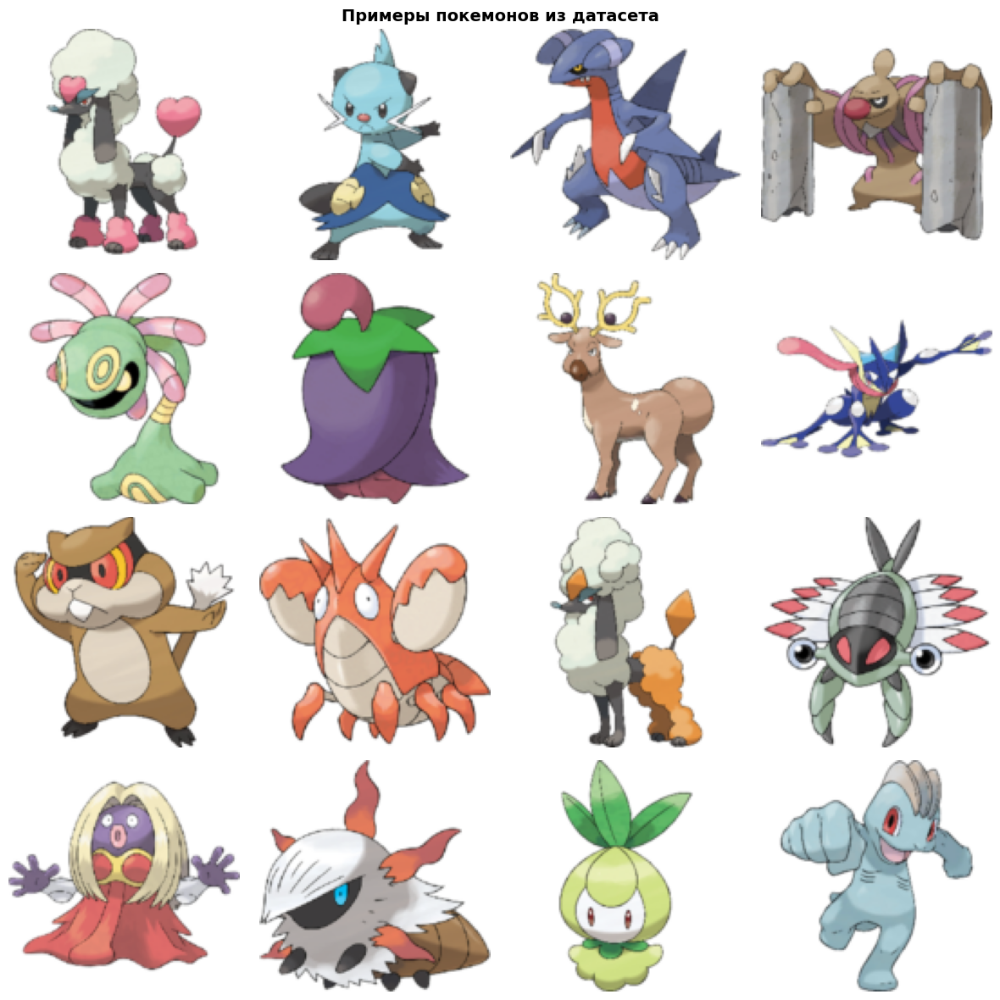

In [24]:
def show_pokemon_grid(
    dataloader: DataLoader, 
    n_samples: int = 16, 
    title: str = "Примеры покемонов из датасета"
) -> plt.Figure:
    """Отображение сетки покемонов"""
    data_iter = iter(dataloader)
    images, _ = next(data_iter)
    
    n_rows: int = 4
    n_cols: int = 4
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 12))
    axes = axes.flatten()
    
    for i in range(min(n_samples, len(images))):
        img: np.ndarray = images[i].permute(1, 2, 0).cpu().numpy()
        img = (img * 0.5 + 0.5).clip(0, 1)
        
        axes[i].imshow(img)
        axes[i].axis('off')
    
    for i in range(n_samples, len(axes)):
        axes[i].axis('off')
    
    plt.suptitle(title, fontsize=14, fontweight='bold')
    plt.tight_layout()
    return fig

print("\n Визуализация датасета:")
fig = show_pokemon_grid(train_loader, n_samples=16)
plt.savefig('pokemon_dataset_samples.png', dpi=150, bbox_inches='tight')
plt.show()

### 2.Имплементируем VQ-VAE

In [25]:
class VectorQuantizer(nn.Module):
    """
    Векторный квантайзер - дискретизация латентного пространства
    Использует кодовую книгу обучаемых эмбеддингов
    """
    def __init__(
        self, 
        num_embeddings: int, 
        embedding_dim: int, 
        commitment_cost: float = 0.25
    ):
        super().__init__()
        
        self.embedding_dim: int = embedding_dim
        self.num_embeddings: int = num_embeddings
        self.commitment_cost: float = commitment_cost
        
        # Кодовая книга
        self.embedding = nn.Embedding(num_embeddings, embedding_dim)
        self.embedding.weight.data.uniform_(-1/num_embeddings, 1/num_embeddings)
        
    def forward(
        self, 
        inputs: torch.Tensor
    ) -> Tuple[torch.Tensor, torch.Tensor, torch.Tensor]:
        """
        Args:
            inputs: [B, C, H, W]
        Returns:
            quantized: [B, C, H, W]
            loss: scalar
            indices: [B, H, W]
        """
        # Преобразуем в [B, H, W, C]
        inputs = inputs.permute(0, 2, 3, 1).contiguous()
        input_shape = inputs.shape
        
        # Flatten в [B*H*W, C]
        flat_input: torch.Tensor = inputs.view(-1, self.embedding_dim)
        
        # Вычисление расстояний: ||z_e - e||^2 = ||z_e||^2 + ||e||^2 - 2*z_e*e
        distances: torch.Tensor = (
            torch.sum(flat_input**2, dim=1, keepdim=True) 
            + torch.sum(self.embedding.weight**2, dim=1)
            - 2 * torch.matmul(flat_input, self.embedding.weight.t())
        )
        
        # Находим ближайший код
        encoding_indices: torch.Tensor = torch.argmin(distances, dim=1).unsqueeze(1)
        
        # One-hot encoding
        encodings: torch.Tensor = torch.zeros(
            encoding_indices.shape[0], 
            self.num_embeddings, 
            device=inputs.device
        )
        encodings.scatter_(1, encoding_indices, 1)
        
        # Квантование
        quantized: torch.Tensor = torch.matmul(encodings, self.embedding.weight)
        quantized = quantized.view(input_shape)
        
        # Потери
        e_latent_loss: torch.Tensor = F.mse_loss(quantized.detach(), inputs)
        q_latent_loss: torch.Tensor = F.mse_loss(quantized, inputs.detach())
        loss: torch.Tensor = q_latent_loss + self.commitment_cost * e_latent_loss
        
        # Straight-through estimator
        quantized = inputs + (quantized - inputs).detach()
        
        # Возвращаем в формат [B, C, H, W]
        quantized = quantized.permute(0, 3, 1, 2).contiguous()
        
        indices: torch.Tensor = encoding_indices.view(
            input_shape[0], input_shape[1], input_shape[2]
        )
        
        return quantized, loss, indices

class ResidualBlock(nn.Module):
    """Residual блок с нормализацией"""
    def __init__(self, in_channels: int, out_channels: int):
        super().__init__()
        
        self.conv1 = nn.Conv2d(in_channels, out_channels, 3, padding=1)
        self.bn1 = nn.BatchNorm2d(out_channels)
        self.conv2 = nn.Conv2d(out_channels, out_channels, 3, padding=1)
        self.bn2 = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU(inplace=True)
        
        self.shortcut = nn.Sequential()
        if in_channels != out_channels:
            self.shortcut = nn.Sequential(
                nn.Conv2d(in_channels, out_channels, 1),
                nn.BatchNorm2d(out_channels)
            )
    
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        residual: torch.Tensor = self.shortcut(x)
        
        out: torch.Tensor = self.relu(self.bn1(self.conv1(x)))
        out = self.bn2(self.conv2(out))
        out += residual
        out = self.relu(out)
        
        return out


class VQVAE(nn.Module):
    """
    Encoder -> Vector Quantization -> Decoder
    """
    def __init__(
        self, 
        num_embeddings: int = 512, 
        embedding_dim: int = 64,
        num_residual_blocks: int = 2
    ):
        super().__init__()
        
        self.num_embeddings: int = num_embeddings
        self.embedding_dim: int = embedding_dim
        
        # Энкодер: 128x128 -> 32x32
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 64, 4, stride=2, padding=1),      # 64x64
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 128, 4, stride=2, padding=1),    # 32x32
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            *[ResidualBlock(128, 128) for _ in range(num_residual_blocks)],
            nn.Conv2d(128, embedding_dim, 3, padding=1),
        )
        
        # Векторный квантайзер
        self.vq_layer = VectorQuantizer(num_embeddings, embedding_dim)
        
        # Декодер: 32x32 -> 128x128
        self.decoder = nn.Sequential(
            nn.Conv2d(embedding_dim, 128, 3, padding=1),
            *[ResidualBlock(128, 128) for _ in range(num_residual_blocks)],
            nn.ConvTranspose2d(128, 64, 4, stride=2, padding=1),  # 64x64
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(64, 3, 4, stride=2, padding=1),    # 128x128
            nn.Tanh()
        )
        
    def encode(self, x: torch.Tensor) -> torch.Tensor:
        """Кодирование в дискретные индексы"""
        z_e: torch.Tensor = self.encoder(x)
        _, _, indices = self.vq_layer(z_e)
        return indices
    
    def decode(self, z_q: torch.Tensor) -> torch.Tensor:
        """Декодирование из квантованных векторов"""
        return self.decoder(z_q)
    
    def decode_indices(self, indices: torch.Tensor) -> torch.Tensor:
        """Декодирование напрямую из индексов"""
        batch_size, h, w = indices.shape
        
        indices_flat: torch.Tensor = indices.view(-1)
        quantized_flat: torch.Tensor = self.vq_layer.embedding(indices_flat)
        quantized: torch.Tensor = quantized_flat.view(batch_size, h, w, self.embedding_dim)
        quantized = quantized.permute(0, 3, 1, 2).contiguous()
        
        return self.decode(quantized)
    
    def forward(
        self, 
        x: torch.Tensor
    ) -> Tuple[torch.Tensor, torch.Tensor, torch.Tensor]:
        """
        Args:
            x: [B, 3, 128, 128]
        Returns:
            x_recon: [B, 3, 128, 128]
            vq_loss: scalar
            indices: [B, 32, 32]
        """
        z_e: torch.Tensor = self.encoder(x)
        z_q, vq_loss, indices = self.vq_layer(z_e)
        x_recon: torch.Tensor = self.decode(z_q)
        
        return x_recon, vq_loss, indices

### 3. Пишем код трейна VQ-VAE

In [26]:
def train_vqvae(
    model: VQVAE, 
    train_loader: DataLoader, 
    test_loader: DataLoader, 
    epochs: int = 50, 
    lr: float = 2e-4,
    save_freq: int = 10,
) -> Dict[str, List[float]]:
    """Обучение VQ-VAE"""
    
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode='min', factor=0.5, patience=5, verbose=True
    )
    
    train_losses: List[float] = []
    test_losses: List[float] = []
    recon_losses: List[float] = []
    vq_losses: List[float] = []
    
    print("\n" + "="*70)
    print("ОБУЧЕНИЕ VQ-VAE")
    print("="*70)
    
    for epoch in range(epochs):
        model.train()
        total_loss: float = 0.0
        total_recon: float = 0.0
        total_vq: float = 0.0
        
        pbar = tqdm(train_loader, desc=f'Epoch {epoch+1}/{epochs}')
        for data, _ in pbar:
            data = data.to(device)
            
            optimizer.zero_grad()
            
            recon, vq_loss, _ = model(data)
            recon_loss: torch.Tensor = F.mse_loss(recon, data)
            loss: torch.Tensor = recon_loss + vq_loss
            
            loss.backward()
            optimizer.step()
            
            total_loss += loss.item()
            total_recon += recon_loss.item()
            total_vq += vq_loss.item()
            
            pbar.set_postfix({
                'loss': f'{loss.item():.4f}',
                'recon': f'{recon_loss.item():.4f}',
                'vq': f'{vq_loss.item():.4f}'
            })
        
        avg_loss: float = total_loss / len(train_loader)
        avg_recon: float = total_recon / len(train_loader)
        avg_vq: float = total_vq / len(train_loader)
        
        train_losses.append(avg_loss)
        recon_losses.append(avg_recon)
        vq_losses.append(avg_vq)
        
        # Валидация
        model.eval()
        test_loss: float = 0.0
        with torch.no_grad():
            for data, _ in test_loader:
                data = data.to(device)
                recon, vq_loss, _ = model(data)
                recon_loss = F.mse_loss(recon, data)
                loss = recon_loss + vq_loss
                test_loss += loss.item()
        
        avg_test_loss: float = test_loss / len(test_loader)
        test_losses.append(avg_test_loss)
        
        scheduler.step(avg_test_loss)
        
        
        if (epoch + 1) % save_freq == 0:
            print(f'\nEpoch {epoch+1}/{epochs}:')
            print(f'  Train Loss: {avg_loss:.4f} (Recon: {avg_recon:.4f}, VQ: {avg_vq:.4f})')
            print(f'  Test Loss:  {avg_test_loss:.4f}')
            print(f'  LR: {optimizer.param_groups[0]["lr"]:.6f}')
            torch.save(model.state_dict(), f'vqvae_epoch_{epoch+1}.pth')
    
    return {
        'train_losses': train_losses,
        'test_losses': test_losses,
        'recon_losses': recon_losses,
        'vq_losses': vq_losses
    }


### 4. Запускаем и смотрим

In [27]:
print("\n Создание VQ-VAE...")
vqvae: VQVAE = VQVAE(
    num_embeddings=512,
    embedding_dim=64,
    num_residual_blocks=2
).to(device)

total_params: int = sum(p.numel() for p in vqvae.parameters())
trainable_params: int = sum(p.numel() for p in vqvae.parameters() if p.requires_grad)
print(f"Всего параметров: {total_params:,}")
print(f"Обучаемых параметров: {trainable_params:,}")

history: Dict[str, List[float]] = train_vqvae(
    vqvae, train_loader, test_loader, epochs=50, lr=2e-4
)


 Создание VQ-VAE...


/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:60: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Всего параметров: 1,632,195
Обучаемых параметров: 1,632,195

ОБУЧЕНИЕ VQ-VAE


Epoch 10/50: 100%|████████████████████████████████████████████| 47/47 [00:01<00:00, 32.48it/s, loss=0.9976, recon=0.0417, vq=0.9560]



Epoch 10/50:
  Train Loss: 0.9268 (Recon: 0.0351, VQ: 0.8917)
  Test Loss:  1.2982
  LR: 0.000200


Epoch 20/50: 100%|████████████████████████████████████████████| 47/47 [00:01<00:00, 32.04it/s, loss=0.4743, recon=0.0512, vq=0.4232]



Epoch 20/50:
  Train Loss: 0.4513 (Recon: 0.0319, VQ: 0.4195)
  Test Loss:  0.5928
  LR: 0.000200


Epoch 30/50: 100%|████████████████████████████████████████████| 47/47 [00:01<00:00, 33.19it/s, loss=0.2902, recon=0.0471, vq=0.2430]



Epoch 30/50:
  Train Loss: 0.3437 (Recon: 0.0304, VQ: 0.3133)
  Test Loss:  0.3624
  LR: 0.000200


Epoch 40/50: 100%|████████████████████████████████████████████| 47/47 [00:01<00:00, 32.15it/s, loss=0.2592, recon=0.0427, vq=0.2165]



Epoch 40/50:
  Train Loss: 0.1949 (Recon: 0.0259, VQ: 0.1690)
  Test Loss:  0.2560
  LR: 0.000100


Epoch 50/50: 100%|████████████████████████████████████████████| 47/47 [00:01<00:00, 32.23it/s, loss=0.2516, recon=0.1089, vq=0.1427]



Epoch 50/50:
  Train Loss: 0.1641 (Recon: 0.0259, VQ: 0.1382)
  Test Loss:  0.1673
  LR: 0.000100


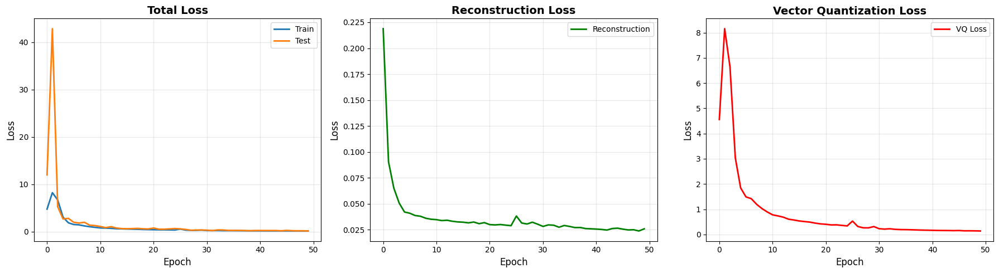


 Реконструкция покемонов:


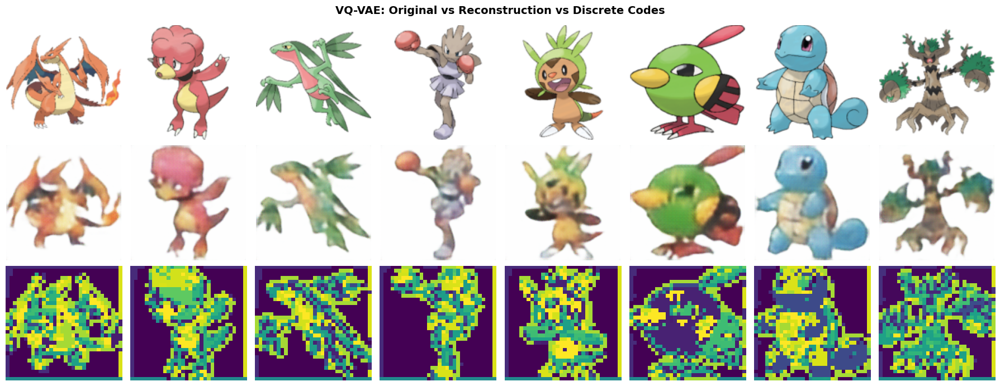


📊 Анализ кодовой книги...


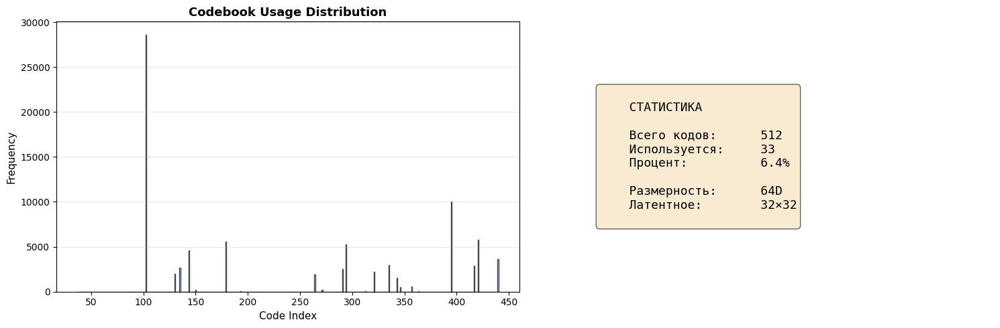

In [28]:
def plot_training_curves(history: Dict[str, List[float]]) -> plt.Figure:
    """График обучения"""
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    
    axes[0].plot(history['train_losses'], label='Train', linewidth=2)
    axes[0].plot(history['test_losses'], label='Test', linewidth=2)
    axes[0].set_xlabel('Epoch', fontsize=12)
    axes[0].set_ylabel('Loss', fontsize=12)
    axes[0].set_title('Total Loss', fontsize=14, fontweight='bold')
    axes[0].legend()
    axes[0].grid(True, alpha=0.3)
    
    axes[1].plot(history['recon_losses'], label='Reconstruction', linewidth=2, color='green')
    axes[1].set_xlabel('Epoch', fontsize=12)
    axes[1].set_ylabel('Loss', fontsize=12)
    axes[1].set_title('Reconstruction Loss', fontsize=14, fontweight='bold')
    axes[1].legend()
    axes[1].grid(True, alpha=0.3)
    
    axes[2].plot(history['vq_losses'], label='VQ Loss', linewidth=2, color='red')
    axes[2].set_xlabel('Epoch', fontsize=12)
    axes[2].set_ylabel('Loss', fontsize=12)
    axes[2].set_title('Vector Quantization Loss', fontsize=14, fontweight='bold')
    axes[2].legend()
    axes[2].grid(True, alpha=0.3)
    
    plt.tight_layout()
    return fig

fig = plot_training_curves(history)
plt.savefig('vqvae_training_curves.png', dpi=150, bbox_inches='tight')
plt.show()


def visualize_vqvae_reconstruction(
    model: VQVAE, 
    dataloader: DataLoader, 
    n_samples: int = 8
) -> plt.Figure:
    """Визуализация реконструкции"""
    model.eval()
    
    with torch.no_grad():
        data, _ = next(iter(dataloader))
        data = data[:n_samples].to(device)
        
        recon, _, indices = model(data)
        
        fig, axes = plt.subplots(3, n_samples, figsize=(18, 7))
        
        for i in range(n_samples):
            # Оригинал
            img: np.ndarray = data[i].cpu().permute(1, 2, 0).numpy()
            img = (img * 0.5 + 0.5).clip(0, 1)
            axes[0, i].imshow(img)
            axes[0, i].axis('off')
            if i == 0:
                axes[0, i].set_ylabel('Original', fontsize=11, fontweight='bold')
            
            # Реконструкция
            img = recon[i].cpu().permute(1, 2, 0).numpy()
            img = (img * 0.5 + 0.5).clip(0, 1)
            axes[1, i].imshow(img)
            axes[1, i].axis('off')
            if i == 0:
                axes[1, i].set_ylabel('Reconstructed', fontsize=11, fontweight='bold')
            
            # Коды
            codes: np.ndarray = indices[i].cpu().numpy()
            axes[2, i].imshow(codes, cmap='viridis', aspect='auto')
            axes[2, i].axis('off')
            if i == 0:
                axes[2, i].set_ylabel('Discrete Codes', fontsize=11, fontweight='bold')
        
        plt.suptitle('VQ-VAE: Original vs Reconstruction vs Discrete Codes', 
                    fontsize=14, fontweight='bold')
        plt.tight_layout()
        
    return fig

print("\n Реконструкция покемонов:")
fig = visualize_vqvae_reconstruction(vqvae, test_loader, n_samples=8)
plt.savefig('vqvae_reconstruction.png', dpi=150, bbox_inches='tight')
plt.show()


def analyze_codebook_usage(
    model: VQVAE, 
    dataloader: DataLoader
) -> plt.Figure:
    """Анализ использования кодовой книги"""
    model.eval()
    all_indices: List[np.ndarray] = []
    
    print("\n📊 Анализ кодовой книги...")
    with torch.no_grad():
        for data, _ in tqdm(dataloader, desc='Collecting codes'):
            data = data.to(device)
            _, _, indices = model(data)
            all_indices.append(indices.cpu().numpy().flatten())
    
    all_indices_flat: np.ndarray = np.concatenate(all_indices)
    
    fig, axes = plt.subplots(1, 2, figsize=(15, 5))
    
    # Гистограмма
    axes[0].hist(all_indices_flat, bins=model.num_embeddings, 
                edgecolor='black', alpha=0.7, color='skyblue')
    axes[0].set_xlabel('Code Index', fontsize=11)
    axes[0].set_ylabel('Frequency', fontsize=11)
    axes[0].set_title('Codebook Usage Distribution', fontsize=13, fontweight='bold')
    axes[0].grid(True, alpha=0.3, axis='y')
    
    # Статистика
    unique_codes: int = len(np.unique(all_indices_flat))
    usage_percent: float = (unique_codes / model.num_embeddings) * 100
    
    stats_text: str = f"""
    СТАТИСТИКА
    
    Всего кодов:      {model.num_embeddings}
    Используется:     {unique_codes}
    Процент:          {usage_percent:.1f}%
    
    Размерность:      {model.embedding_dim}D
    Латентное:        32×32
    """
    
    axes[1].text(0.15, 0.5, stats_text, fontsize=13, verticalalignment='center',
                bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.6),
                family='monospace')
    axes[1].axis('off')
    
    plt.tight_layout()
    return fig

fig = analyze_codebook_usage(vqvae, test_loader)
plt.savefig('vqvae_codebook_analysis.png', dpi=150, bbox_inches='tight')
plt.show()

## 4. Пробуем DCGAN

In [31]:
## Параметры

IMG_SIZE: int = 64
BATCH_SIZE: int = 32
Z_DIM: int = 100

# ✅ Трансформации с аугментациями для GAN
transform: transforms.Compose = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    
    # Аугментации для разнообразия
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.RandomRotation(10),
    transforms.RandomAffine(degrees=0, translate=(0.1, 0.1), scale=(0.9, 1.1)),
    
    transforms.ToTensor(),
    transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
])

# Загрузка датасета
DATASET_PATH: str = './data/pokemons'

print("\n" + "="*70)
print("LOADING POKEMON DATASET")
print("="*70)

dataset: PokemonDataset = PokemonDataset(
    root_dir=DATASET_PATH,
    transform=transform
)

# ✅ Для GAN обычно используют весь датасет без разделения
# (тестирование GAN делается визуально, не по метрикам)
train_loader: DataLoader = DataLoader(
    dataset, 
    batch_size=BATCH_SIZE, 
    shuffle=True, 
    num_workers=2, 
    pin_memory=True,
    drop_last=True  # ✅ Важно для стабильности BatchNorm
)



LOADING POKEMON DATASET
Найдено 819 изображений


In [32]:
## DCGAN Architecture

def weights_init(m):
    """Инициализация весов (DCGAN paper)"""
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)


class DCGANGenerator(nn.Module):
    """DCGAN Generator"""
    def __init__(self, z_dim=100, img_channels=3, feature_map=64):
        super().__init__()
        
        self.net = nn.Sequential(
            # Input: Z (100) -> 4x4x(fm*16)
            nn.ConvTranspose2d(z_dim, feature_map * 16, 4, 1, 0, bias=False),
            nn.BatchNorm2d(feature_map * 16),
            nn.ReLU(True),
            
            # 4x4 -> 8x8
            nn.ConvTranspose2d(feature_map * 16, feature_map * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(feature_map * 8),
            nn.ReLU(True),
            
            # 8x8 -> 16x16
            nn.ConvTranspose2d(feature_map * 8, feature_map * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(feature_map * 4),
            nn.ReLU(True),
            
            # 16x16 -> 32x32
            nn.ConvTranspose2d(feature_map * 4, feature_map * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(feature_map * 2),
            nn.ReLU(True),
            
            # 32x32 -> 64x64
            nn.ConvTranspose2d(feature_map * 2, img_channels, 4, 2, 1, bias=False),
            nn.Tanh()
        )
    
    def forward(self, z):
        z = z.view(z.size(0), z.size(1), 1, 1)
        return self.net(z)


class DCGANDiscriminator(nn.Module):
    """DCGAN Discriminator"""
    def __init__(self, img_channels=3, feature_map=64):
        super().__init__()
        
        self.net = nn.Sequential(
            # 64x64 -> 32x32
            nn.Conv2d(img_channels, feature_map, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            
            # 32x32 -> 16x16
            nn.Conv2d(feature_map, feature_map * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(feature_map * 2),
            nn.LeakyReLU(0.2, inplace=True),
            
            # 16x16 -> 8x8
            nn.Conv2d(feature_map * 2, feature_map * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(feature_map * 4),
            nn.LeakyReLU(0.2, inplace=True),
            
            # 8x8 -> 4x4
            nn.Conv2d(feature_map * 4, feature_map * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(feature_map * 8),
            nn.LeakyReLU(0.2, inplace=True),
            
            # 4x4 -> 1x1
            nn.Conv2d(feature_map * 8, 1, 4, 1, 0, bias=False),
        )
    
    def forward(self, x):
        return self.net(x).view(-1, 1).squeeze(1)



In [33]:
import matplotlib.pyplot as plt
from typing import Dict, List
import numpy as np


def plot_gan_training_curves(history: Dict[str, List[float]]) -> plt.Figure:
    """
    График обучения GAN
    
    Args:
        history: словарь с ключами:
            - 'g_losses': список G losses
            - 'd_losses': список D losses
            - 'd_real_probs': список D(real)
            - 'd_fake_probs': список D(fake)
    """
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    
    epochs = range(1, len(history['g_losses']) + 1)
    
    # 1. Generator vs Discriminator Loss
    ax = axes[0, 0]
    ax.plot(epochs, history['g_losses'], label='Generator', 
            linewidth=2, color='blue', alpha=0.8)
    ax.plot(epochs, history['d_losses'], label='Discriminator', 
            linewidth=2, color='red', alpha=0.8)
    ax.set_xlabel('Epoch', fontsize=12)
    ax.set_ylabel('Loss', fontsize=12)
    ax.set_title('Generator vs Discriminator Loss', fontsize=14, fontweight='bold')
    ax.legend(fontsize=11)
    ax.grid(True, alpha=0.3)
    
    # Добавляем зону стабильности
    ax.axhline(y=np.mean(history['g_losses']), color='blue', 
               linestyle='--', alpha=0.3, label='G mean')
    ax.axhline(y=np.mean(history['d_losses']), color='red', 
               linestyle='--', alpha=0.3, label='D mean')
    
    # 2. Discriminator Probabilities
    ax = axes[0, 1]
    ax.plot(epochs, history['d_real_probs'], label='D(real)', 
            linewidth=2, color='green', alpha=0.8)
    ax.plot(epochs, history['d_fake_probs'], label='D(fake)', 
            linewidth=2, color='orange', alpha=0.8)
    ax.axhline(y=0.5, color='gray', linestyle='--', alpha=0.5, 
               linewidth=2, label='Ideal (0.5)')
    
    # Зона стабильности
    ax.fill_between(epochs, 0.4, 0.6, alpha=0.1, color='green', 
                     label='Stable zone')
    
    ax.set_xlabel('Epoch', fontsize=12)
    ax.set_ylabel('Probability', fontsize=12)
    ax.set_title('Discriminator Probabilities', fontsize=14, fontweight='bold')
    ax.set_ylim([0, 1])
    ax.legend(fontsize=11)
    ax.grid(True, alpha=0.3)
    
    # 3. GAN Balance (разница между D(real) и D(fake))
    ax = axes[1, 0]
    balance = np.array(history['d_real_probs']) - np.array(history['d_fake_probs'])
    
    ax.plot(epochs, balance, linewidth=2, color='purple', alpha=0.8)
    ax.axhline(y=0.5, color='green', linestyle='--', alpha=0.5, 
               linewidth=2, label='Good balance')
    ax.fill_between(epochs, 0.3, 0.7, alpha=0.1, color='green', 
                     label='Healthy range')
    
    ax.set_xlabel('Epoch', fontsize=12)
    ax.set_ylabel('D(real) - D(fake)', fontsize=12)
    ax.set_title('GAN Balance Score', fontsize=14, fontweight='bold')
    ax.legend(fontsize=11)
    ax.grid(True, alpha=0.3)
    
    # Аннотации для режимов
    if balance[-1] > 0.8:
        ax.text(len(epochs)*0.5, 0.9, '⚠️ D too strong', 
                fontsize=12, color='red', ha='center', 
                bbox=dict(boxstyle='round', facecolor='yellow', alpha=0.5))
    elif balance[-1] < 0.2:
        ax.text(len(epochs)*0.5, 0.1, '⚠️ G too strong', 
                fontsize=12, color='red', ha='center',
                bbox=dict(boxstyle='round', facecolor='yellow', alpha=0.5))
    
    # 4. Loss Ratio (G_loss / D_loss)
    ax = axes[1, 1]
    loss_ratio = np.array(history['g_losses']) / (np.array(history['d_losses']) + 1e-8)
    
    ax.plot(epochs, loss_ratio, linewidth=2, color='teal', alpha=0.8)
    ax.axhline(y=1.0, color='gray', linestyle='--', alpha=0.5, 
               linewidth=2, label='Equal (1.0)')
    ax.fill_between(epochs, 0.5, 2.0, alpha=0.1, color='green', 
                     label='Acceptable range')
    
    ax.set_xlabel('Epoch', fontsize=12)
    ax.set_ylabel('G Loss / D Loss', fontsize=12)
    ax.set_title('Loss Ratio', fontsize=14, fontweight='bold')
    ax.legend(fontsize=11)
    ax.grid(True, alpha=0.3)
    ax.set_yscale('log')
    
    plt.tight_layout()
    return fig


In [42]:
def train_dcgan_balanced(generator, discriminator, train_loader, epochs=300, save_every=10):
    """DCGAN с автоматической балансировкой"""
    
    g_optim = torch.optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
    d_optim = torch.optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))
    
    criterion = nn.BCEWithLogitsLoss()
    fixed_noise = torch.randn(64, Z_DIM, device=device)
    
    history = {
        'g_losses': [],
        'd_losses': [],
        'd_real_probs': [],
        'd_fake_probs': [],
    }
    
    # ✅ Счётчики для балансировки
    d_train_ratio = 1  # Сколько раз обучать D на 1 обучение G
    
    for epoch in range(epochs):
        generator.train()
        discriminator.train()
        
        epoch_g_loss = 0
        epoch_d_loss = 0
        epoch_d_real = 0
        epoch_d_fake = 0
        
        pbar = tqdm(train_loader, desc=f'Epoch {epoch+1}/{epochs}')
        
        for i, (real_imgs, _) in enumerate(pbar):
            batch_size = real_imgs.size(0)
            real_imgs = real_imgs.to(device)
            
            # ✅ Более сильный label smoothing для D
            real_labels = torch.ones(batch_size, device=device) * 0.85  # было 0.9
            fake_labels = torch.zeros(batch_size, device=device) + 0.05  # было 0.0
            
            # ==================== Train Discriminator ====================
            # ✅ Обучаем D только если он не слишком силён
            d_real_prob_current = 0
            d_fake_prob_current = 0
            
            if d_train_ratio > 0:  # Пропускаем некоторые итерации D
                d_optim.zero_grad()
                
                # ✅ Добавляем шум к входам D (instance noise)
                noise_strength = 0.05 * max(0, 1 - epoch / 100)  # уменьшается со временем
                real_imgs_noisy = real_imgs + torch.randn_like(real_imgs) * noise_strength
                
                # Real images
                real_output = discriminator(real_imgs_noisy)
                d_loss_real = criterion(real_output, real_labels)
                
                # Fake images
                z = torch.randn(batch_size, Z_DIM, device=device)
                fake_imgs = generator(z).detach()
                fake_imgs_noisy = fake_imgs + torch.randn_like(fake_imgs) * noise_strength
                fake_output = discriminator(fake_imgs_noisy)
                d_loss_fake = criterion(fake_output, fake_labels)
                
                d_loss = d_loss_real + d_loss_fake
                d_loss.backward()
                
                # ✅ Gradient clipping для стабильности
                torch.nn.utils.clip_grad_norm_(discriminator.parameters(), 0.5)
                
                d_optim.step()
                
                d_real_prob_current = torch.sigmoid(real_output).mean().item()
                d_fake_prob_current = torch.sigmoid(fake_output).mean().item()
                
                epoch_d_loss += d_loss.item()
            
            # ==================== Train Generator ====================
            # ✅ Обучаем G несколько раз если D слишком силён
            g_iterations = 2 if d_real_prob_current > 0.85 else 1
            
            for _ in range(g_iterations):
                g_optim.zero_grad()
                
                z = torch.randn(batch_size, Z_DIM, device=device)
                fake_imgs = generator(z)
                fake_output = discriminator(fake_imgs)
                
                g_loss = criterion(fake_output, real_labels)
                g_loss.backward()
                
                # ✅ Gradient clipping
                torch.nn.utils.clip_grad_norm_(generator.parameters(), 0.5)
                
                g_optim.step()
            
            epoch_g_loss += g_loss.item()
            epoch_d_real += d_real_prob_current if d_train_ratio > 0 else epoch_d_real / max(1, i)
            epoch_d_fake += d_fake_prob_current if d_train_ratio > 0 else epoch_d_fake / max(1, i)
            
            pbar.set_postfix({
                'g': f'{g_loss.item():.3f}',
                'd': f'{d_loss.item() if d_train_ratio > 0 else 0:.3f}',
                'D(real)': f'{d_real_prob_current:.2f}',
                'D(fake)': f'{d_fake_prob_current:.2f}',
                'g_iter': g_iterations,
                'd_skip': d_train_ratio == 0
            })
        
        # Epoch summary
        avg_g_loss = epoch_g_loss / len(train_loader)
        avg_d_loss = epoch_d_loss / max(1, len(train_loader))
        avg_d_real = epoch_d_real / len(train_loader)
        avg_d_fake = epoch_d_fake / len(train_loader)
        
        history['g_losses'].append(avg_g_loss)
        history['d_losses'].append(avg_d_loss)
        history['d_real_probs'].append(avg_d_real)
        history['d_fake_probs'].append(avg_d_fake)
        
        # ✅ Адаптивная балансировка для следующей эпохи
        balance = avg_d_real - avg_d_fake
        
        if avg_d_real > 0.90 and avg_d_fake < 0.2:
            # D слишком силён
            d_train_ratio = 0.5  # Обучаем D только 50% времени
            print(f'\n⚠️ D too strong! Reducing D training')
        elif avg_d_real < 0.4:
            # D слишком слаб
            d_train_ratio = 2  # Обучаем D в 2 раза чаще
            print(f'\n⚠️ D too weak! Increasing D training')
        else:
            d_train_ratio = 1  # Нормально
        if (epoch + 1) % 10 == 0:
            print(f'\n📊 Epoch {epoch+1}/{epochs}:')
            print(f'   G: {avg_g_loss:.4f} | D: {avg_d_loss:.4f}')
            print(f'   D(real): {avg_d_real:.3f} | D(fake): {avg_d_fake:.3f}')
            print(f'   Balance: {balance:.3f} | D train ratio: {d_train_ratio}')
            
        # Generate samples
        if (epoch + 1) % save_every == 0 or epoch == 0:
            generator.eval()
            with torch.no_grad():
                fake_samples = generator(fixed_noise)
                
                fig = plt.figure(figsize=(12, 12))
                for idx in range(64):
                    ax = fig.add_subplot(8, 8, idx + 1)
                    img = fake_samples[idx].cpu().permute(1, 2, 0).numpy()
                    img = (img * 0.5 + 0.5).clip(0, 1)
                    ax.imshow(img)
                    ax.axis('off')
                
                plt.suptitle(
                    f'Epoch {epoch+1} | D(real)={avg_d_real:.2f} D(fake)={avg_d_fake:.2f}',
                    fontsize=14, fontweight='bold'
                )
                plt.tight_layout()
                plt.savefig(f'pokemon_balanced_epoch_{epoch+1:03d}.png', dpi=150)
                plt.close()
            
            generator.train()
            
            # Сохраняем чекпоинт
            torch.save({
                'epoch': epoch,
                'generator': generator.state_dict(),
                'discriminator': discriminator.state_dict(),
                'history': history,
            }, f'pokemon_balanced_checkpoint_{epoch+1:03d}.pth')
    
    return history


print("\n" + "="*70)
print("TRAINING WITH BALANCED APPROACH")
print("="*70)

# Переинициализируем модели
generator = DCGANGenerator(z_dim=Z_DIM).to(device)
discriminator = DCGANDiscriminator().to(device)

generator.apply(weights_init)
discriminator.apply(weights_init)

# Запускаем сбалансированное обучение
history = train_dcgan_balanced(
    generator, 
    discriminator, 
    train_loader, 
    epochs=200, 
    save_every=20
)


TRAINING WITH BALANCED APPROACH


Epoch 10/200: 100%|███████████████| 25/25 [00:01<00:00, 14.41it/s, g=4.249, d=0.771, D(real)=0.86, D(fake)=0.23, g_iter=2, d_skip=0]



📊 Epoch 10/200:
   G: 3.4610 | D: 0.8362
   D(real): 0.813 | D(fake): 0.151
   Balance: 0.663 | D train ratio: 1


Epoch 20/200: 100%|███████████████| 25/25 [00:01<00:00, 14.58it/s, g=1.121, d=1.095, D(real)=0.63, D(fake)=0.23, g_iter=1, d_skip=0]



📊 Epoch 20/200:
   G: 1.7568 | D: 1.1450
   D(real): 0.623 | D(fake): 0.309
   Balance: 0.314 | D train ratio: 1


Epoch 30/200: 100%|███████████████| 25/25 [00:01<00:00, 13.87it/s, g=0.945, d=1.474, D(real)=0.38, D(fake)=0.29, g_iter=1, d_skip=0]



📊 Epoch 30/200:
   G: 1.9836 | D: 1.2164
   D(real): 0.625 | D(fake): 0.319
   Balance: 0.306 | D train ratio: 1


Epoch 40/200: 100%|███████████████| 25/25 [00:01<00:00, 14.07it/s, g=2.235, d=1.058, D(real)=0.47, D(fake)=0.07, g_iter=1, d_skip=0]



📊 Epoch 40/200:
   G: 2.2941 | D: 1.0014
   D(real): 0.717 | D(fake): 0.240
   Balance: 0.477 | D train ratio: 1


Epoch 50/200: 100%|███████████████| 25/25 [00:01<00:00, 14.02it/s, g=1.272, d=0.755, D(real)=0.68, D(fake)=0.07, g_iter=1, d_skip=0]



📊 Epoch 50/200:
   G: 2.3949 | D: 0.9386
   D(real): 0.711 | D(fake): 0.203
   Balance: 0.509 | D train ratio: 1


Epoch 60/200: 100%|███████████████| 25/25 [00:01<00:00, 14.11it/s, g=1.596, d=0.806, D(real)=0.71, D(fake)=0.15, g_iter=1, d_skip=0]



📊 Epoch 60/200:
   G: 2.0103 | D: 1.0524
   D(real): 0.665 | D(fake): 0.251
   Balance: 0.414 | D train ratio: 1


Epoch 70/200: 100%|███████████████| 25/25 [00:01<00:00, 14.17it/s, g=1.620, d=0.948, D(real)=0.87, D(fake)=0.35, g_iter=2, d_skip=0]



📊 Epoch 70/200:
   G: 2.1075 | D: 1.0020
   D(real): 0.666 | D(fake): 0.206
   Balance: 0.461 | D train ratio: 1


Epoch 80/200: 100%|███████████████| 25/25 [00:01<00:00, 14.17it/s, g=1.318, d=0.972, D(real)=0.87, D(fake)=0.37, g_iter=2, d_skip=0]



📊 Epoch 80/200:
   G: 2.1986 | D: 1.1120
   D(real): 0.624 | D(fake): 0.227
   Balance: 0.397 | D train ratio: 1


Epoch 90/200: 100%|███████████████| 25/25 [00:01<00:00, 14.39it/s, g=2.323, d=0.692, D(real)=0.77, D(fake)=0.10, g_iter=1, d_skip=0]



📊 Epoch 90/200:
   G: 2.0632 | D: 0.8937
   D(real): 0.714 | D(fake): 0.189
   Balance: 0.525 | D train ratio: 1


Epoch 100/200: 100%|██████████████| 25/25 [00:01<00:00, 14.41it/s, g=3.544, d=1.111, D(real)=0.44, D(fake)=0.02, g_iter=1, d_skip=0]



📊 Epoch 100/200:
   G: 2.1533 | D: 0.9300
   D(real): 0.703 | D(fake): 0.169
   Balance: 0.533 | D train ratio: 1


Epoch 110/200: 100%|██████████████| 25/25 [00:01<00:00, 14.18it/s, g=2.067, d=1.179, D(real)=0.91, D(fake)=0.47, g_iter=2, d_skip=0]



📊 Epoch 110/200:
   G: 2.5655 | D: 0.9873
   D(real): 0.673 | D(fake): 0.159
   Balance: 0.514 | D train ratio: 1


Epoch 120/200: 100%|██████████████| 25/25 [00:01<00:00, 14.29it/s, g=2.410, d=0.970, D(real)=0.88, D(fake)=0.30, g_iter=2, d_skip=0]



📊 Epoch 120/200:
   G: 2.4107 | D: 0.9320
   D(real): 0.716 | D(fake): 0.168
   Balance: 0.547 | D train ratio: 1


Epoch 130/200: 100%|██████████████| 25/25 [00:01<00:00, 14.59it/s, g=2.223, d=0.964, D(real)=0.83, D(fake)=0.36, g_iter=1, d_skip=0]



📊 Epoch 130/200:
   G: 2.4083 | D: 0.9553
   D(real): 0.697 | D(fake): 0.162
   Balance: 0.535 | D train ratio: 1


Epoch 140/200: 100%|██████████████| 25/25 [00:01<00:00, 14.41it/s, g=3.286, d=0.864, D(real)=0.73, D(fake)=0.18, g_iter=1, d_skip=0]



📊 Epoch 140/200:
   G: 2.2814 | D: 0.9881
   D(real): 0.689 | D(fake): 0.167
   Balance: 0.521 | D train ratio: 1


Epoch 150/200: 100%|██████████████| 25/25 [00:01<00:00, 14.44it/s, g=1.886, d=0.872, D(real)=0.55, D(fake)=0.05, g_iter=1, d_skip=0]



📊 Epoch 150/200:
   G: 2.4218 | D: 0.8095
   D(real): 0.740 | D(fake): 0.132
   Balance: 0.608 | D train ratio: 1


Epoch 160/200: 100%|██████████████| 25/25 [00:01<00:00, 14.20it/s, g=1.746, d=0.704, D(real)=0.78, D(fake)=0.11, g_iter=1, d_skip=0]



📊 Epoch 160/200:
   G: 2.4603 | D: 0.8907
   D(real): 0.713 | D(fake): 0.140
   Balance: 0.573 | D train ratio: 1


Epoch 170/200: 100%|██████████████| 25/25 [00:01<00:00, 14.24it/s, g=2.958, d=0.899, D(real)=0.95, D(fake)=0.20, g_iter=2, d_skip=0]



📊 Epoch 170/200:
   G: 2.1316 | D: 0.9471
   D(real): 0.720 | D(fake): 0.184
   Balance: 0.536 | D train ratio: 1


Epoch 180/200: 100%|██████████████| 25/25 [00:01<00:00, 14.39it/s, g=3.404, d=0.668, D(real)=0.85, D(fake)=0.07, g_iter=1, d_skip=0]



📊 Epoch 180/200:
   G: 2.4172 | D: 0.9380
   D(real): 0.686 | D(fake): 0.130
   Balance: 0.555 | D train ratio: 1


Epoch 190/200: 100%|██████████████| 25/25 [00:01<00:00, 14.48it/s, g=2.944, d=0.837, D(real)=0.57, D(fake)=0.05, g_iter=1, d_skip=0]



📊 Epoch 190/200:
   G: 2.3484 | D: 1.0240
   D(real): 0.680 | D(fake): 0.172
   Balance: 0.508 | D train ratio: 1


Epoch 200/200: 100%|██████████████| 25/25 [00:01<00:00, 14.49it/s, g=1.708, d=0.960, D(real)=0.93, D(fake)=0.31, g_iter=2, d_skip=0]



📊 Epoch 200/200:
   G: 2.6304 | D: 0.8816
   D(real): 0.715 | D(fake): 0.120
   Balance: 0.595 | D train ratio: 1


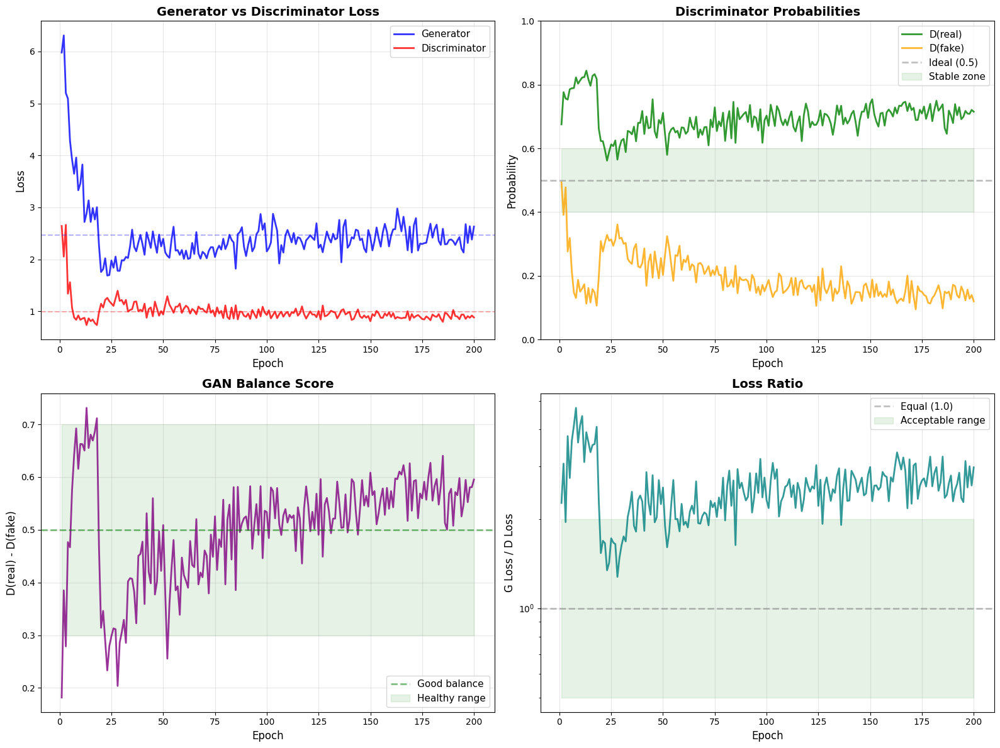

In [43]:
# Графики
fig = plot_gan_training_curves(history)
plt.savefig('balanced_training_curves.png', dpi=150)
plt.show()

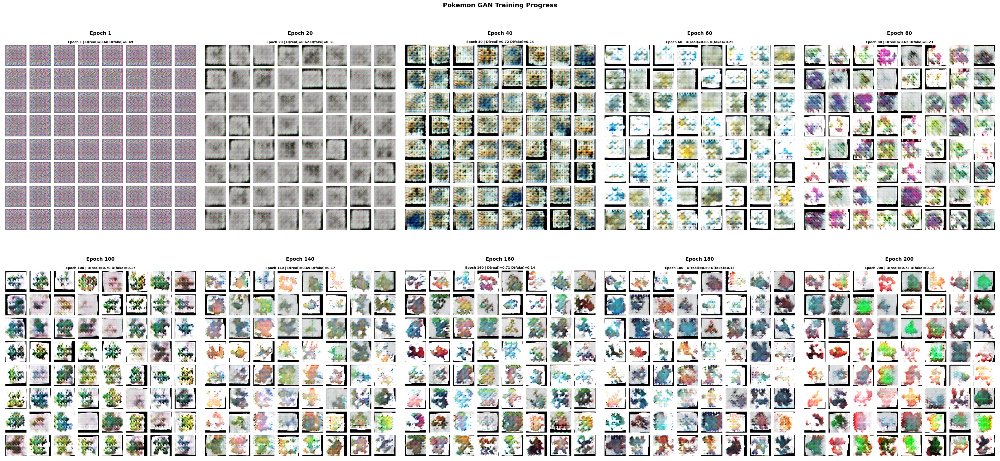

In [47]:
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

epochs=[1, 20, 40, 60, 80, 100, 140, 160, 180, 200]

n_epochs = len(epochs)
fig, axes = plt.subplots(2, 5, figsize=(40, 20))
axes = axes.flatten()

for idx, epoch in enumerate(epochs):
    try:
        img_path = f'pokemon_balanced_gan/pokemon_balanced_epoch_{epoch:03d}.png'
        img = Image.open(img_path)
        
        axes[idx].imshow(img)
        axes[idx].set_title(f'Epoch {epoch}', fontsize=14, fontweight='bold')
        axes[idx].axis('off')
    except FileNotFoundError:
        axes[idx].text(0.5, 0.5, f'Epoch {epoch}\nNot Found', 
                      ha='center', va='center', fontsize=12)
        axes[idx].axis('off')

plt.suptitle('Pokemon GAN Training Progress', 
             fontsize=18, fontweight='bold', y=0.98)
plt.tight_layout()
plt.savefig('training_progress.png', dpi=150, bbox_inches='tight')
plt.show()
